In [1]:
!hostname

gpusrv71.scidom.de


In [2]:
import numpy as np
import scanpy as sc
import matplotlib.pyplot as plt
from numpy.random import default_rng
import squidpy as sq
import pandas as pd
import anndata as ad
from pathlib import Path
from jax.config import config
import seaborn as sns
from sklearn.preprocessing import StandardScaler, MinMaxScaler
from joblib import delayed, Parallel
from anndata import AnnData
import mplscience
from tqdm import tqdm
import os
import seml

mplscience.set_style()

config.update("jax_enable_x64", True)
# # sc.set_figure_params()
%load_ext autoreload
%autoreload 2
%load_ext lab_black

/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/python3.9/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm


In [3]:
path_data = Path(
    "/lustre/groups/ml01/workspace/moscot_paper/benchmarks/space/fgw_brain"
)
adata1 = ad.read(path_data / "a90c46a33a51ed3944ab21789f51c8a9_0.5_1.h5ad")
adata2 = ad.read(path_data / "a90c46a33a51ed3944ab21789f51c8a9_0.5_2.h5ad")

In [4]:
adata1.obs["batch_final"] = adata1.obs["batch"].replace(
    {adata1.obs["batch"].unique()[0]: "0", adata1.obs["batch"].unique()[1]: "1"}
)
adata2.obs["batch_final"] = adata2.obs["batch"].replace(
    {adata2.obs["batch"].unique()[0]: "0", adata2.obs["batch"].unique()[1]: "1"}
)

In [ ]:
from jax.config import config

import scanpy as sc

config.update("jax_enable_x64", True)
import time

epsilon = 1e-4
genes = False

from moscot.problems.generic import SinkhornProblem

import numpy as np

results = {}

if genes:
    sc.pp.pca(adata1)
    sc.pp.pca(adata2)
    adata1.obsm["pca_spatial"] = np.hstack(
        [adata1.obsm["X_pca"], adata1.obsm["spatial_norm_affine"]]
    )
    adata2.obsm["pca_spatial"] = np.hstack(
        [adata2.obsm["X_pca"], adata2.obsm["spatial_norm_affine"]]
    )
    linear_cost = "pca_spatial"
else:
    linear_cost = "spatial_norm_affine"

start = time.time()
sp1 = (
    SinkhornProblem(adata=adata1)
    .prepare(
        key="batch_final",
        joint_attr={"attr": "obsm", "key": linear_cost},
    )
    .solve(epsilon=epsilon, threshold=1e-6, batch_size=20_000, max_iterations=8000)
)
sp2 = (
    SinkhornProblem(adata=adata2)
    .prepare(
        key="batch_final",
        joint_attr={"attr": "obsm", "key": linear_cost},
    )
    .solve(epsilon=epsilon, threshold=1e-6, batch_size=20_000, max_iterations=8000)
)
end = time.time()

/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/python3.9/site-packages/flax/core/frozen_dict.py:169: FutureWarning: jax.tree_util.register_keypaths is deprecated, and will be removed in a future release. Please use `register_pytree_with_keys()` instead.
  jax.tree_util.register_keypaths(
/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/python3.9/site-packages/docrep/decorators.py:43: SyntaxWarning: 'interpolation_parameters' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/python3.9/site-packages/docrep/decorators.py:43: SyntaxWarning: 'account_for_unbalancedness' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/python3.9/site-packages/docrep/decorators.py:43: SyntaxWarning: 'batch_size' is not a valid key!
  doc = func(self, args[0].__doc__, *args[1:], **kwargs)
/home/icb/giovanni.palla/miniconda3/envs/moscot2/lib/p

INFO     Solving problem OTProblem[stage='prepared', shape=(78329, 88884)].                                        


In [11]:
print(end - start)

30587.96392583847


In [ ]:
# sp1.save(path_results, file_prefix=f"{unique_id}_1_{epsilon}")
# sp2.save(path_results, file_prefix=f"{unique_id}_2_{epsilon}")

adata1_final = adata1[adata1.obs.batch_final.isin(["0"])].copy()
adata2_final = adata1[adata1.obs.batch_final.isin(["1"])].copy()

adata1_copy = adata2[adata2.obs.batch_final.isin(["0"])].copy()
adata3_final = adata2[adata2.obs.batch_final.isin(["1"])].copy()

spatial2 = (
    sp1[("0", "1")]
    .solution.to("cpu")
    .push(adata1_final.obsm["spatial_norm"], scale_by_marginals=True)
)
spatial3 = (
    sp2[("0", "1")]
    .solution.to("cpu")
    .push(adata1_copy.obsm["spatial_norm"], scale_by_marginals=True)
)

# get min max and normalize
spatial1 = adata1_final.obsm["spatial_norm"].copy()
spatial1.min()
spatial1.max()

adata1_final.obsm["spatial_norm_final"] = (spatial1 - spatial1.min()) / (
    spatial1.max() - spatial1.min()
)
adata2_final.obsm["spatial_norm_final"] = (spatial2 - spatial2.min()) / (
    spatial2.max() - spatial2.min()
)
adata3_final.obsm["spatial_norm_final"] = (spatial3 - spatial3.min()) / (
    spatial3.max() - spatial3.min()
)

adata_final = ad.concat(
    [adata1_final, adata2_final, adata3_final],
    label="batch_final",
    keys=["0", "1", "2"],
)
# adata_final.write(path_results / f"{unique_id}_sink.h5ad")

/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(
/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


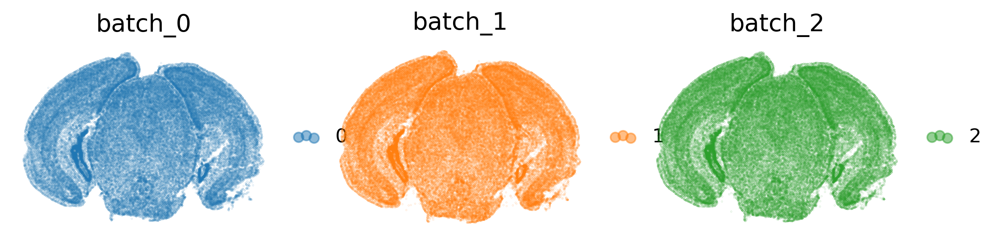

In [12]:
fig, ax = plt.subplots(1, 3, figsize=(10, 3), dpi=300)
for i, a in enumerate(ax):
    sq.pl.spatial_scatter(
        adata_final,
        spatial_key="spatial_norm_final",
        shape=None,
        color="batch_final",
        groups=[f"{i}"],
        frameon=False,
        title=[f"batch_{i}"],
        size=0.01,
        alpha=0.5,
        fig=fig,
        ax=a,
    )

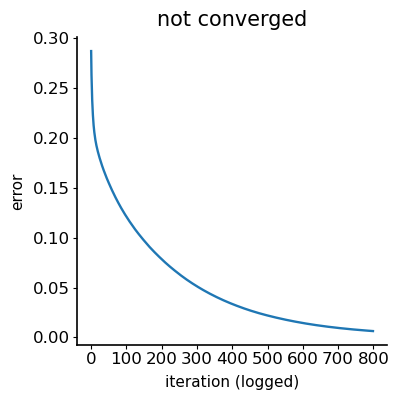

In [19]:
sp1[("0", "1")].solution.plot_errors()

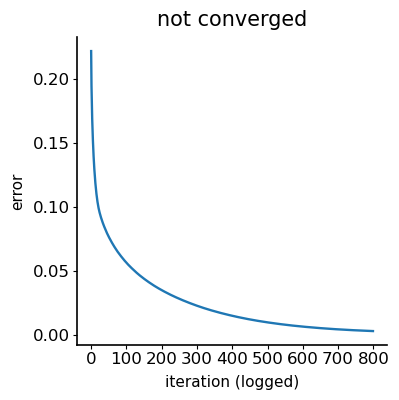

In [20]:
sp2[("0", "1")].solution.plot_errors()

In [21]:
print(end - start)

30587.96392583847


In [16]:
# adata = sc.read(root / "e8ce51e1641a8a25f8548d99ec75c93f_sink.h5ad")

/home/icb/giovanni.palla/code/squidpy/squidpy/pl/_spatial_utils.py:956: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap', 'norm' will be ignored
  _cax = scatter(


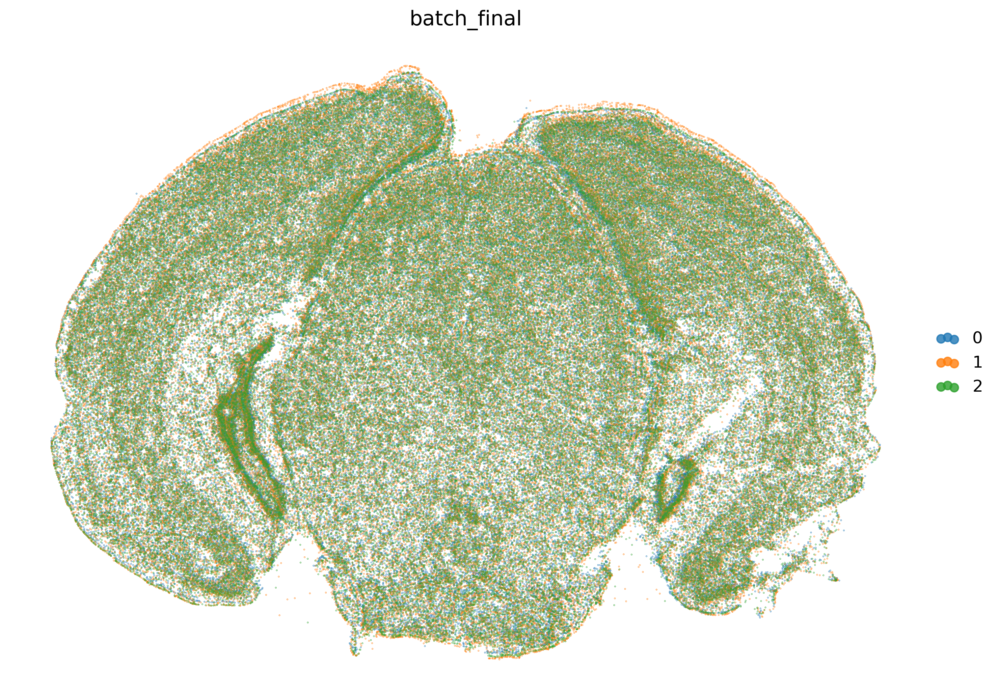

In [22]:
sq.pl.spatial_scatter(
    adata_final,
    spatial_key="spatial_norm_final",
    shape=None,
    color="batch_final",
    frameon=False,
    size=0.1,
    alpha=0.8,
    figsize=(10, 10),
    dpi=300,
)

In [23]:
adata_final.write(
    "/lustre/groups/ml01/workspace/moscot_paper/benchmarks/space/sink_brain/adata_aligned_section2.h5ad"
)